In [1]:
import math
import numpy as np


def linear_kernel(X, Y):
    return np.matmul(X, Y.transpose(0, 1))

def rbf(X, Y, sigma=None):
    """
    Radial-Basis Function kernel for X and Y with bandwith chosen
    from median if not specified.
    """
    GX = np.dot(X, Y.T)
    KX = np.diag(GX) - GX + (np.diag(GX) - GX).T
    if sigma is None:
        mdist = np.median(KX[KX != 0])
        sigma = math.sqrt(mdist)
    KX *= - 0.5 / (sigma * sigma)
    KX = np.exp(KX)
    return KX

def HSIC(K, L):
    """
    Calculate Hilbert-Schmidt Independence Criterion on K and L.
    """
    n = K.shape[0]
    H = np.identity(n) - (1./n) * np.ones((n, n))

    KH = np.matmul(K, H)
    LH = np.matmul(L, H)
    return 1./((n-1)**2) * np.trace(np.matmul(KH, LH))

def CKA(X, Y, kernel=None):
    """
    Calculate Centered Kernel Alingment for X and Y. If no kernel
    is specified, the linear kernel will be used.
    """
    kernel = linear_kernel if kernel is None else kernel
    if len(X.shape) == 1:
        X = X.unsqueeze(1)
        Y = Y.unsqueeze(1)
    K = kernel(X, X)
    L = kernel(Y, Y)
        
    hsic = HSIC(K, L)
    varK = np.sqrt(HSIC(K, K))
    varL = np.sqrt(HSIC(L, L))
    return hsic / (varK * varL)

# -------------------第二种cka计算方法------------
from torch import Tensor
import torch

def centering(k: Tensor, inplace: bool = True) -> Tensor:
    if not inplace:
        k = torch.clone(k)
    means = k.mean(dim=0)
    means -= means.mean() / 2
    k -= means.view(-1, 1)
    k -= means.view(1, -1)
    return k

def linear_hsic(k: Tensor, l: Tensor, unbiased: bool = True) -> Tensor:
    assert k.shape[0] == l.shape[0], 'Input must have the same size'
    m = k.shape[0]
    if unbiased:
        k.fill_diagonal_(0)
        l.fill_diagonal_(0)
        kl = torch.matmul(k, l)
        score = torch.trace(kl) + k.sum() * l.sum() / ((m - 1) * (m - 2)) - 2 * kl.sum() / (m - 2)
        return score / (m * (m - 3))
    else:
        k, l = centering(k), centering(l)
        return (k * l).sum() / ((m - 1) ** 2)


def cka_score(x1: Tensor, x2: Tensor, gram: bool = False) -> Tensor:
    assert x1.shape[0] == x2.shape[0], 'Input must have the same batch size'
    if len(x1.shape) == 1:
        x1 = x1.unsqueeze(1)
        x2 = x2.unsqueeze(1)
    if not gram:
        x1 = torch.matmul(x1, x1.transpose(0, 1))
        x2 = torch.matmul(x2, x2.transpose(0, 1))
    cross_score = linear_hsic(x1, x2)
    self_score1 = linear_hsic(x1, x1)
    self_score2 = linear_hsic(x2, x2)
    return cross_score / torch.sqrt(self_score1 * self_score2)


# -----------------------余弦相似度计算--------------------
def cos_similar(x1: Tensor, x2: Tensor):
    x1 = x1.flatten()
    x2 = x2.flatten()
    return torch.sum(x1 * x2) / (torch.norm(x1) * torch.norm(x2))


In [7]:
import os
from typing import Union
import numpy as np
import torch
import seaborn as sns
import matplotlib.pyplot as plt

def load_weight_list_by_tag(weight_list_dir, tag = "server"):
    if tag is None:
        tag = "server"
    weight_list_dir = os.path.join(weight_list_dir,tag)
    weight_list = []
    for file in sorted(os.listdir(weight_list_dir)):
        if file.endswith('.pt'):
            weight_path = os.path.join(weight_list_dir, file)
            weight = torch.load(weight_path)
            weight_list.append(weight)
    return weight_list


def filter_weight(weight_list, unselect_list = None, all_select_list = None, any_select_list = None):
    # filtered_weight_list = weight_list
    filtered_weight_list = []
    for weights_dict in weight_list:
        # filtered_weights = {layer_key: weights for layer_key, weights in weights_dict.items() if 'bn' not in layer_key and 'weight' in layer_key}
        
        filtered_weights = {layer_key: weights.cpu() if torch.is_tensor(weights) else weights for layer_key, weights in weights_dict.items() if
                            (unselect_list is None or all(unselected_key not in layer_key for unselected_key in unselect_list)) and 
                            (all_select_list is None or all(selected_key in layer_key for selected_key in all_select_list)) and
                            (any_select_list is None or any(selected_key in layer_key for selected_key in any_select_list))}
        filtered_weight_list.append(filtered_weights)
    return filtered_weight_list

def plot_and_save_heatmap(matrix, save_path, y_labels, x_labels = "auto", save = True, title = 'CKA Similarity Matrix', show = True, w_mul = 1):
    # Create heatmap
    # 宽，高
    plt.figure(figsize=(matrix.shape[1]*w_mul+2,matrix.shape[0]*0.7))
    sns.heatmap(matrix, cmap='coolwarm', annot=True, fmt=".4f", yticklabels=y_labels, xticklabels = x_labels)
    plt.title(title)
    plt.xlabel('Rounds')
    plt.ylabel('Layers')
    
    # Save the heatmap
    if save:
        plt.savefig(save_path)
    if show:
        plt.show()
    plt.close()

def cal_similar_layer_round(weight_list, 
                            cal_score_func = CKA, 
                            begin_round = 0, 
                            round_step = None, 
                            show = False, 
                            describe = "", 
                            tag = "server", 
                            cmp:  Union[str, int] = 'end'):
    round_step = len(weight_list) if round_step is None else round_step
    num_layers = len(weight_list[0])
    cka_matrix = np.zeros((num_layers, round_step))

    for index, layer_key in enumerate(list(weight_list[0])):
        dim = len(weight_list[0][layer_key].shape)
        for round in range(begin_round, begin_round + round_step):
            # print(layer_key, round)
            if cmp == 'end':
                rp = begin_round + round_step - 1
            elif cmp == 'begin':
                rp = begin_round
            else:
                assert isinstance(cmp, int)
                rp = cmp
                
            if dim == 4:
                cka_similarity = cal_score_func(
                    weight_list[rp][layer_key].mean(dim=[-1,-2]), \
                    weight_list[round][layer_key].mean(dim=[-1,-2]))
            else:
                cka_similarity = cal_score_func(
                    weight_list[rp][layer_key], \
                    weight_list[round][layer_key])
            
            cka_matrix[index, round - begin_round] = cka_similarity


    # Normalize cka_matrix
    # scaler = MinMaxScaler()
    # cka_matrix_normalized = scaler.fit_transform(cka_matrix)

    # Save heatmap
    if tag == "server":
        save_path = f'similar_result/{describe}/cka_similarity_heatmap.png'
    else:
        save_path = f'similar_result/{describe}/{tag}/cka_similarity_heatmap.png'

    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    if tag == "server":
        plot_and_save_heatmap(cka_matrix, save_path, y_labels=list(weight_list[0]), x_labels=[i*4 for i in range(begin_round, begin_round + round_step)], show=show)
    else:
        plot_and_save_heatmap(cka_matrix, save_path, y_labels=list(weight_list[0]), x_labels=[i for i in range(begin_round, begin_round + round_step)], show=show)


In [3]:
def cal_similar_by_layer(weight_list, layer_key, cal_score_func = CKA, describe = "", tag = "server"):
    num_rounds = len(weight_list)
    cka_matrix = np.zeros((num_rounds, num_rounds))
    dim = len(weight_list[0][layer_key].shape)
    for round_x in range(0,num_rounds):
        for round_y in range(0,num_rounds):
            # print(layer_key, round)
            if dim == 4:
                cka_similarity = cal_score_func(
                    weight_list[round_x][layer_key].mean(dim=[-1,-2]), \
                    weight_list[round_y][layer_key].mean(dim=[-1,-2]))
            else:
                cka_similarity = cal_score_func(
                    weight_list[round_x][layer_key], \
                    weight_list[round_y][layer_key])
            
            cka_matrix[num_rounds - 1 - round_x, round_y] = cka_similarity

    # Normalize cka_matrix
    # scaler = MinMaxScaler()
    # cka_matrix_normalized = scaler.fit_transform(cka_matrix)

    # Save heatmap
    if tag == "server":
        save_path = f'similar_result/{describe}/each_layer/cka_similarity_{layer_key}.png'
    else:
        save_path = f'similar_result/{describe}/{tag}/each_layer/cka_similarity_{layer_key}.png'

    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    plot_and_save_heatmap(cka_matrix, 
                          save_path, 
                          y_labels=[i for i in range(num_rounds - 1, 0, -1)], 
                          x_labels=[i for i in range(num_rounds)],
                          title=f'{tag}:CKA Similarity By {layer_key}',
                          show = False)

In [4]:
def cal_similay_by_tag(weight_list_dir, 
                       tag, 
                       cal_score = CKA, 
                       unselect_list=['bn'], 
                       all_select_list=['weight'], 
                       any_select_list = None,
                       describe = '',
                       cmp='end'):
    weight_list = load_weight_list_by_tag(weight_list_dir, tag)
    filtered_weight_list = filter_weight(weight_list, 
                                         unselect_list = unselect_list, 
                                         all_select_list = all_select_list, 
                                         any_select_list=any_select_list)
    
    if unselect_list is not None:
        describe += f"+unselect={'&'.join(unselect_list)}"
    if all_select_list is not None:
        describe += f"+allselect={'&'.join(all_select_list)}"
    if any_select_list is not None:
        describe += f"+anyselect={'&'.join(any_select_list)}"
    cal_similar_layer_round(filtered_weight_list, cal_score, show=False, tag=tag, describe=describe, cmp=cmp)
    # for i in filtered_weight_list[0].keys():
    #     cal_similar_by_layer(filtered_weight_list, i, cal_score, tag=tag, describe=describe)


In [8]:
cal_similay_by_tag('weight_lists/20240507-avg/',"server", all_select_list=['weight'], unselect_list=['bn'], describe='20240507-avg')

In [21]:
weight_list = load_weight_list_by_tag('weight_lists/202405091714-bn/', "c1")

In [9]:
def cal_similar_layer_round_v2(weight_list, 
                               cal_score_func = CKA, 
                               begin_round = 0, 
                               round_step = None, 
                               show = False, 
                               describe = "", 
                               tag = "server"):
    round_step = len(weight_list) if round_step is None else round_step
    num_layers = len(weight_list[0])
    begin_round = begin_round
    cka_matrix = np.zeros((num_layers, round_step))

    for index, layer_key in enumerate(list(weight_list[0])):
        dim = len(weight_list[0][layer_key].shape)
        for round in range(begin_round, begin_round + round_step):
            # print(layer_key, round)
            rp = begin_round + round_step - 1
            if dim == 4:
                cka_similarity = cal_score_func(
                    weight_list[rp][layer_key].mean(dim=[-1,-2]), \
                    weight_list[round][layer_key].mean(dim=[-1,-2]))
            else:
                cka_similarity = cal_score_func(
                    weight_list[rp][layer_key], \
                    weight_list[round][layer_key])
            
            cka_matrix[index, round - begin_round] = cka_similarity

    # Normalize cka_matrix
    # scaler = MinMaxScaler()
    # cka_matrix_normalized = scaler.fit_transform(cka_matrix)

    # Save heatmap
    if tag == "server":
        save_path = f'similar_result/{describe}/cka_similarity_heatmap.png'
    else:
        save_path = f'similar_result/{describe}/{tag}/cka_similarity_heatmap.png'

    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    plot_and_save_heatmap(cka_matrix, save_path, 
                          y_labels=list(weight_list[0]), 
                          x_labels=[f'{i}' for i in range(begin_round, begin_round + round_step)], 
                        #   x_labels=[f'{i//5}_{i%5}' for i in range(begin_round, begin_round + round_step)], 
                          show=show,
                          save=False)

def cal_similay_by_tag_v2(weight_list, 
                       tag, 
                       cal_score = CKA, 
                       unselect_list=['bn'], 
                       all_select_list=['weight'], 
                       any_select_list = None,
                       begin_round = 0,
                       round_step = None):
    filtered_weight_list = filter_weight(weight_list, 
                                         unselect_list = unselect_list, 
                                         all_select_list = all_select_list, 
                                         any_select_list=any_select_list)
    
    describe=''
    if unselect_list is not None:
        describe += f"unselect={'&'.join(unselect_list)}"
    if all_select_list is not None:
        describe += f"+allselect={'&'.join(all_select_list)}"
    if any_select_list is not None:
        describe += f"+anyselect={'&'.join(any_select_list)}"
    cal_similar_layer_round_v2(filtered_weight_list, cal_score_func=cal_score, show=True, tag=tag, describe=describe, begin_round=begin_round, round_step=round_step)



In [16]:
tag = f"c0"
weight_list = load_weight_list_by_tag('weight_lists/202405091519-notagg/', tag)

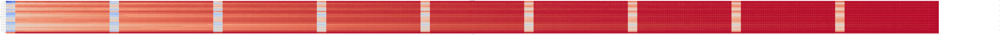

In [14]:
# server
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 0, round_step = 495)


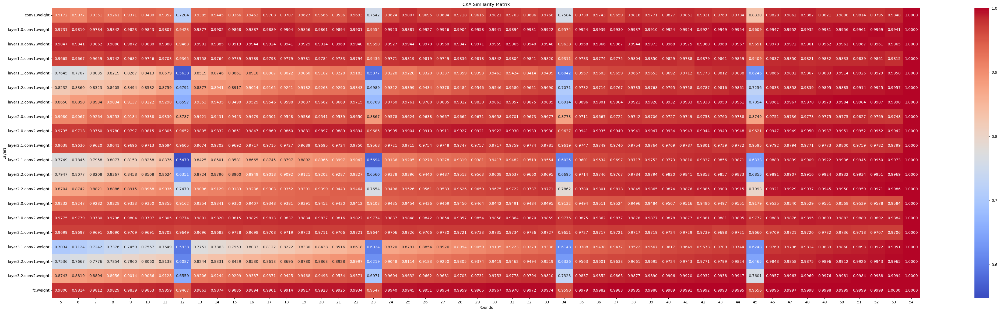

IndexError: list index out of range

In [17]:
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 5, round_step = 50)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 60, round_step = 50)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 115, round_step = 50)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 170, round_step = 50)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 225, round_step = 50)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 280, round_step = 50)

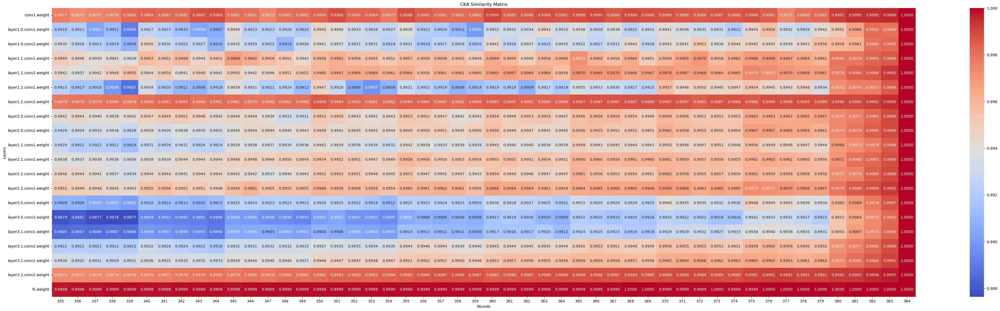

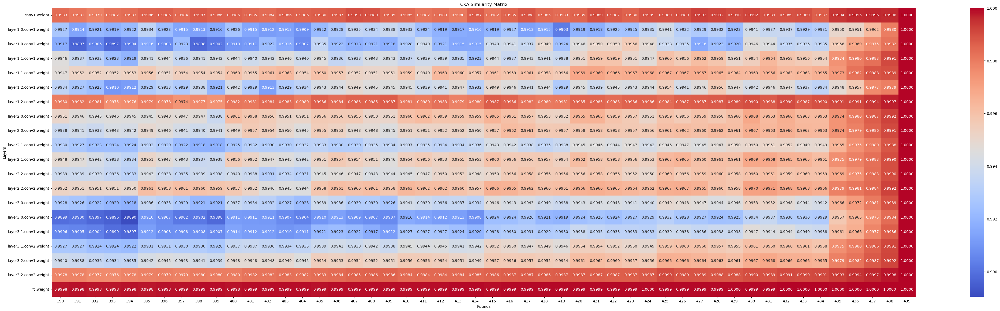

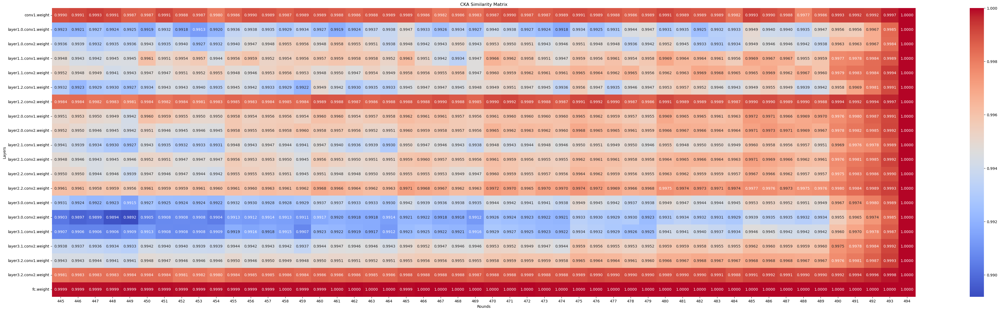

In [13]:
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 335, round_step = 50)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 390, round_step = 50)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 445, round_step = 50)

In [45]:
tag = f"c4"
weight_list = load_weight_list_by_tag('weight_lists/20240507/', tag)

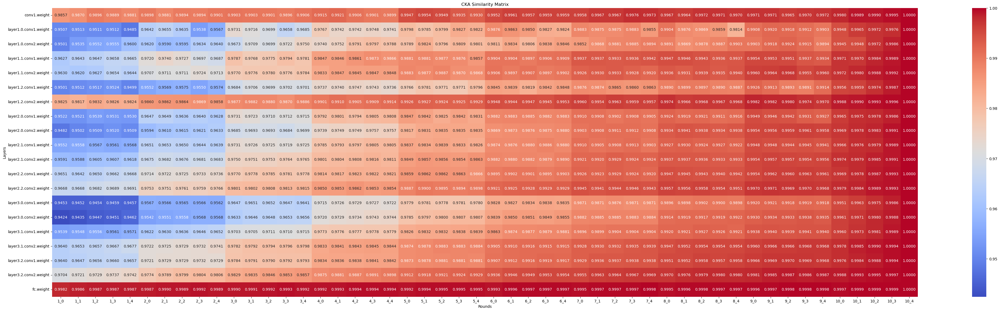

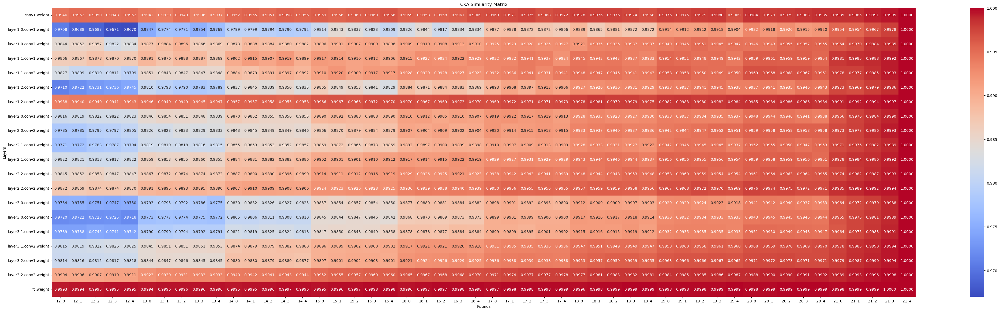

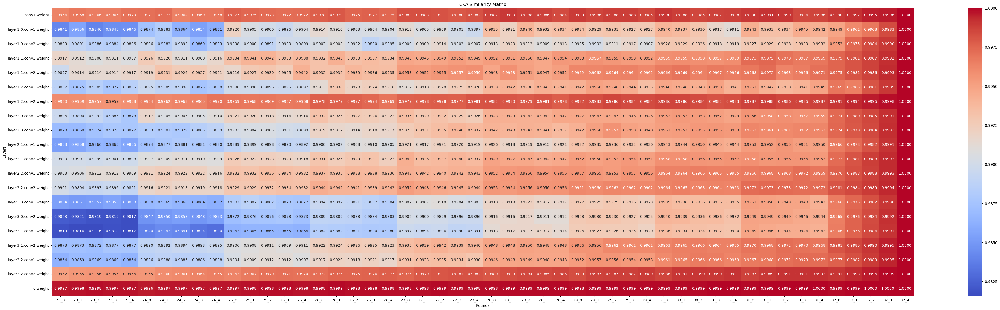

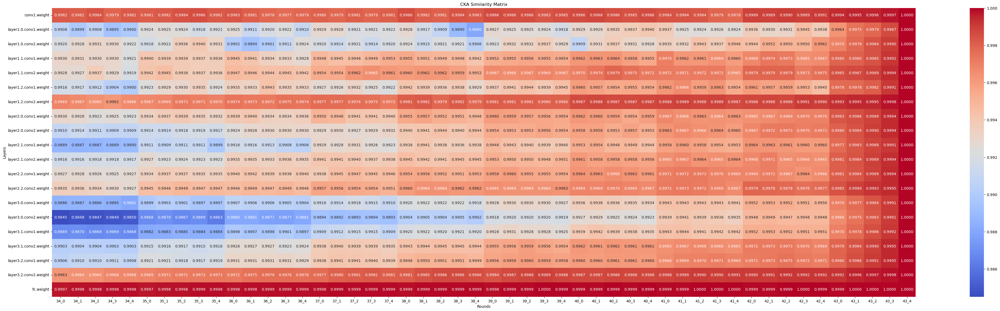

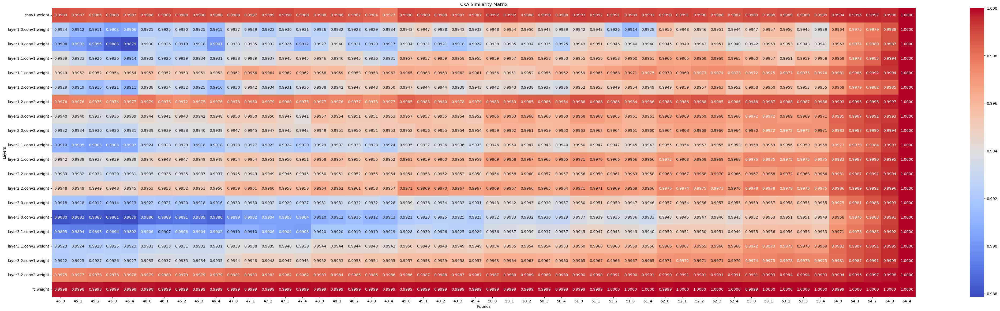

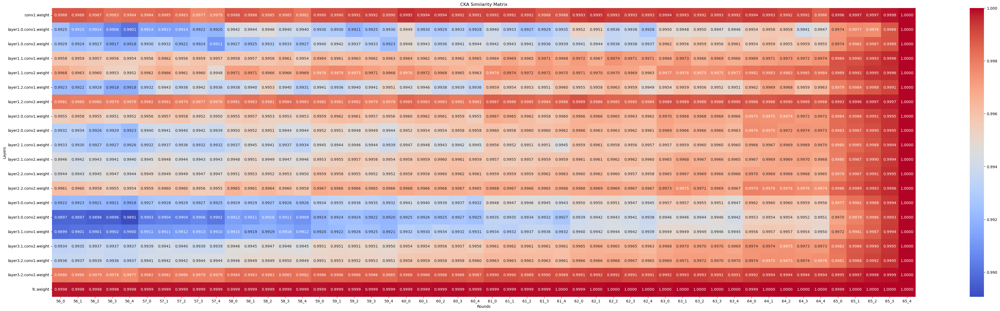

In [46]:
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 5, round_step = 50)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 60, round_step = 50)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 115, round_step = 50)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 170, round_step = 50)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 225, round_step = 50)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 280, round_step = 50)

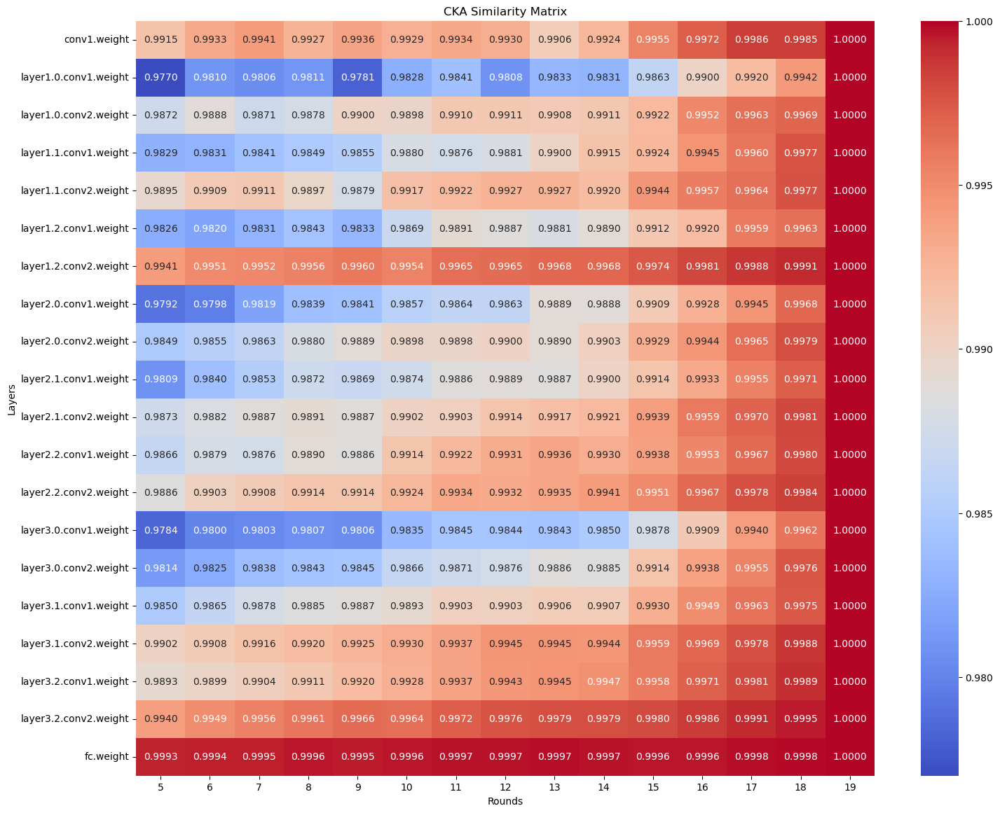

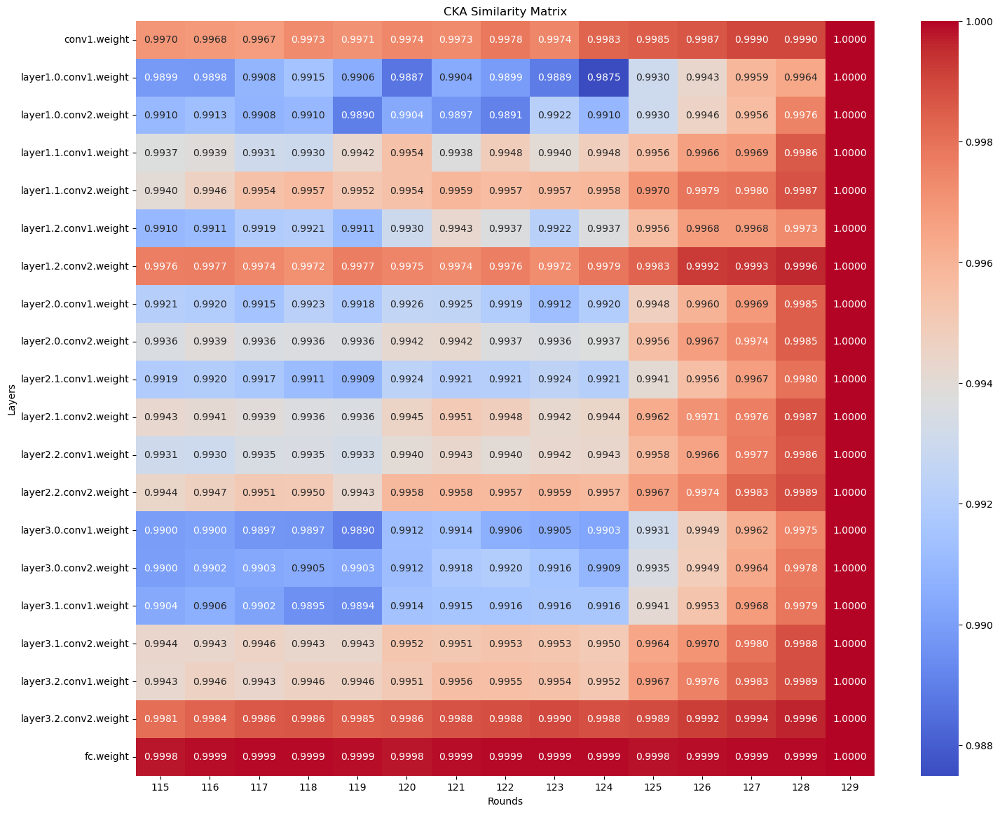

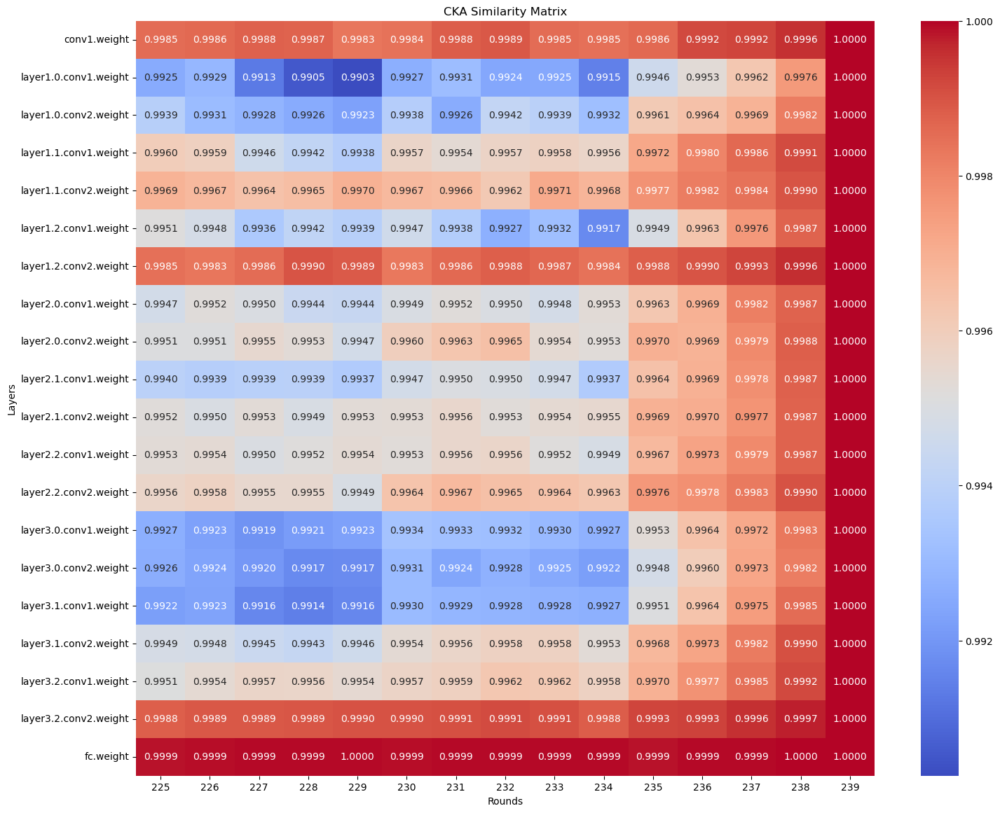

In [15]:
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 5, round_step = 15)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 115, round_step = 15)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 225, round_step = 15)

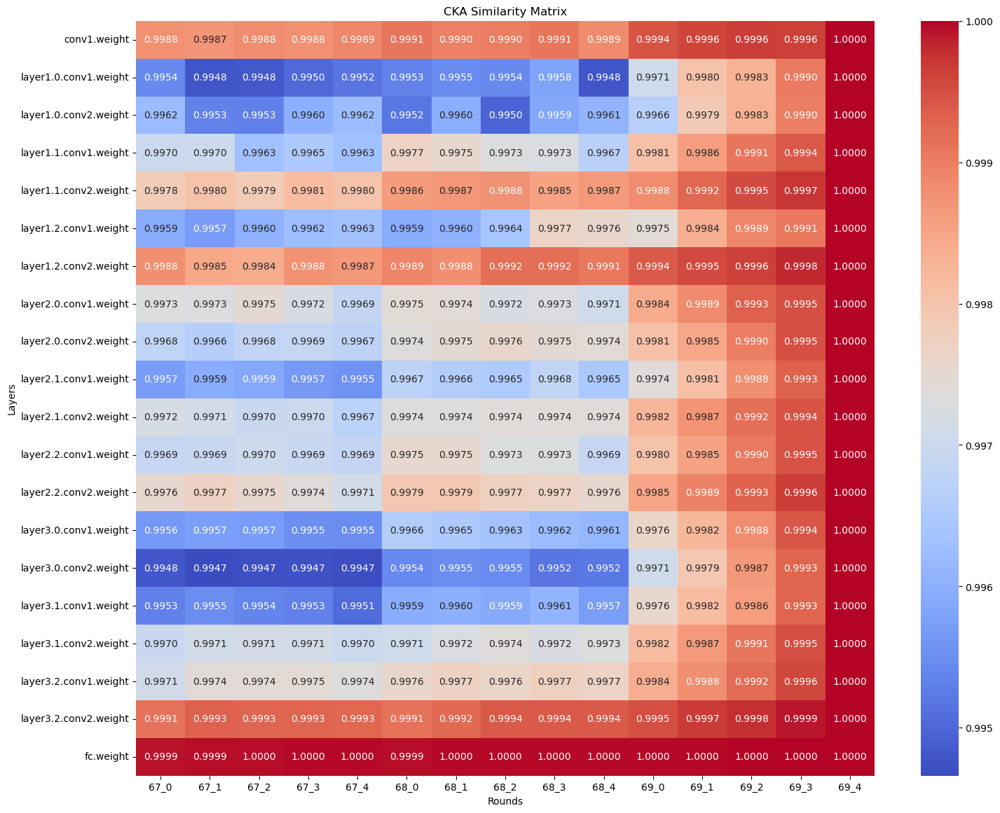

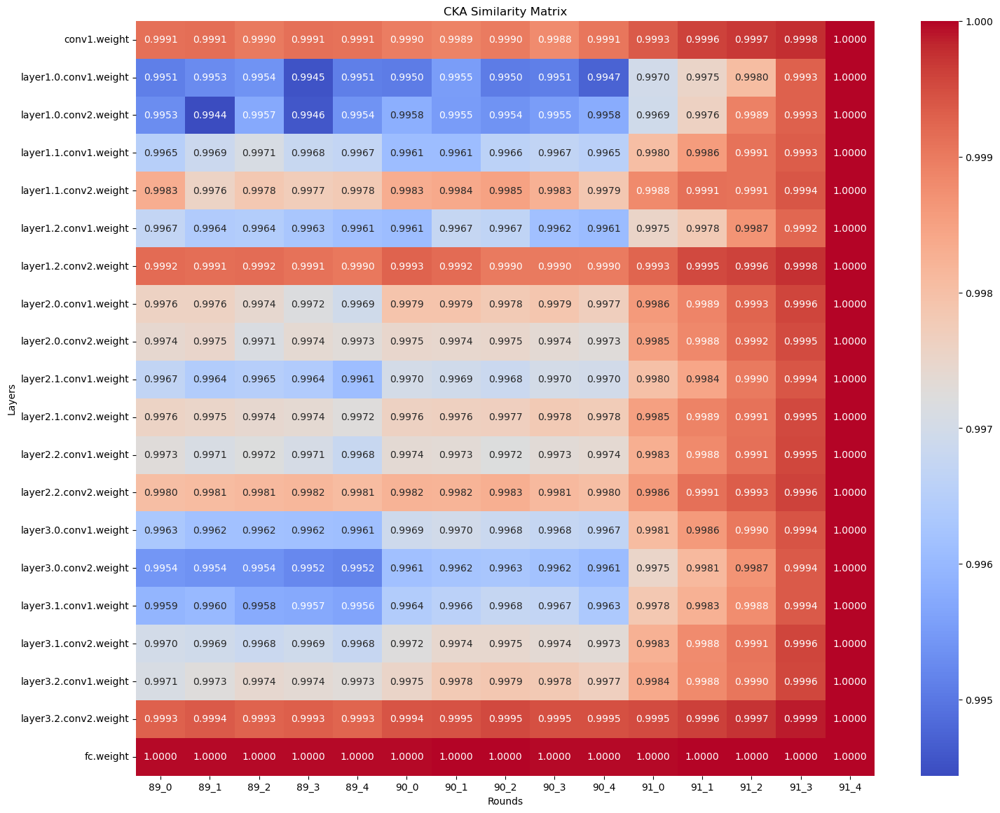

In [63]:
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 335, round_step = 15)
cal_similay_by_tag_v2(weight_list, tag, all_select_list=['weight'], unselect_list=['bn', 'down'], begin_round = 445, round_step = 15)